In [ ]:
 #@title Install Required Packages
!pip install scanpy[leiden]
!pip install matplotlib==3.1.3


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.0 MB 13.3 MB/s 
     |████████████████████████████████| 96 kB 6.0 MB/s 
     |████████████████████████████████| 88 kB 8.4 MB/s 
     |████████████████████████████████| 9.4 MB 16.2 MB/s 
     |████████████████████████████████| 1.3 MB 5.2 MB/s 
     |████████████████████████████████| 295 kB 73.1 MB/s 
     |████████████████████████████████| 965 kB 70.2 MB/s 
     |████████████████████████████████| 1.1 MB 52.4 MB/s 
     |████████████████████████████████| 3.3 MB 54.2 MB/s 
     |████████████████████████████████| 63 kB 2.2 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=8cd6c2bdb7b774b8431867fccd89e5039ffd9e52a518939a9a426f4b5c24e7ef
  Stored in directory: /root/.cache/pip/wheels/a9/3a/67/06a8950e053725912e6a8c42c4a3a241410f6487b8402542ea
  Created wheel for pynndescent: filename=pynndescent-0.5.8-py3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.1 MB 14.6 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.6.2
    Uninstalling matplotlib-3.6.2:
      Successfully uninstalled matplotlib-3.6.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scanpy 1.9.1 requires matplotlib>=3.4, but you have matplotlib 3.1.3 which is incompatible.


In [ ]:
#@title Mount Google Drive (You don't need to run this if you are running notebooks on your laptop)

from google.colab import drive

# The following command will prompt a URL for you to click and obtain the
# authorization code

drive.mount("/content/drive")
from pathlib import Path

# Change this to where you put your hw2 files
DATA = Path("/content/drive/MyDrive/final")

Mounted at /content/drive


In [ ]:
import pandas as pd
from pathlib import Path
import scanpy as sc
import matplotlib as plt
from scipy import stats
import numpy as np
import seaborn as sns
import matplotlib.ticker as mtick
from matplotlib.colors import LinearSegmentedColormap
import os

In [ ]:
#matrix=pd.read_csv(DATA/ "upload.scp.matrix.mtx")
#matrix = sc.read_mtx(DATA/ "upload.scp.matrix.mtx")

In [ ]:
feature = pd.read_csv(DATA / "upload.scp.features2.tsv",sep="\t",header=None)
barcodes = pd.read_csv(DATA / "upload.scp.barcodes.tsv",sep="\t",header=None)

In [ ]:
#read lung h5ad
lung = sc.read(DATA / 'lung.h5ad')

In [ ]:
lung

AnnData object with n_obs × n_vars = 106792 × 30983
    obs: 'n_genes', 'n_UMI', 'percent_mito', 'method', 'doublet', 'predicted_celltype', 'compartment', 'Cluster', 'SubCluster', 'Viral+', 'leiden_res_2', 'leiden_res_1.3', 'donor', 'disease'
    var: 'featureid'
    uns: 'Cluster_colors', 'Nuc-Cell_colors', 'SubCluster_colors', 'W_harmony', 'genome', 'harmony_knn_distances', 'harmony_knn_indices', 'manual_coarse_annotation_colors', 'method_colors', 'modality', 'neighbors', 'pca', 'predictions_colors', 'sample_colors', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'sig_background'
    varm: 'PCs', 'de_res'
    layers: 'counts', 'winsorized'

In [ ]:
lung.layers

Layers with keys: counts, winsorized

In [ ]:
lung.obs['Viral+']

barcodekey
02-P005175-S053-R01-GTTTGGAGTATCAAGA    False
02-P005175-S053-R01-TGCAGTAAGCAGATAT    False
02-P005175-S053-R01-CCCTAACCACTACCGG    False
02-P005175-S053-R01-TCCGAAAAGGTATCTC    False
02-P005175-S053-R01-TGCACGGTCTCGGCTT    False
                                        ...  
04-P006354-S057-R02-AGGTCCGGTGATGATA    False
04-P006354-S057-R02-CTCTACGCAGATCTGT    False
04-P006354-S057-R02-TGACAACTCTCGATGA    False
04-P006354-S057-R02-CATGCCTTCGGATGGA    False
04-P006354-S057-R02-CGTCACTCATTCTTAC    False
Name: Viral+, Length: 106792, dtype: bool

In [ ]:
B_Plasma = sc.read(DATA / 'B_Plasma.h5ad')
Endothelial = sc.read(DATA / 'Endothelial.h5ad')
T_NK = sc.read(DATA / 'T_NK.h5ad')
Myeloid = sc.read(DATA / 'Myeloid.h5ad')

In [ ]:
B_Plasma

AnnData object with n_obs × n_vars = 1693 × 30983
    obs: 'n_genes', 'n_counts', 'percent_mito', 'method', 'Channel', 'manual_coarse_annotation', 'predictions', 'leiden_res_0.3', 'ClusterName', 'Viral+', 'Patient_ID', 'Sample_ID', 'leiden'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'ClusterName_colors', 'PCs', 'W_pca_harmony', 'fmat_highly_variable_features', 'leiden_labels_colors', 'leiden_res_0.3_colors', 'method_colors', 'patient_colors', 'pca', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'sample_colors', 'neighbors', 'leiden', 'leiden_colors'
    obsm: 'X_harmony', 'X_pca', 'X_pca_harmony', 'X_umap', 'sig_background'
    varm: 'de_res'
    layers: 'counts', 'winsorized'
    obsp: 'distances', 'connectivities'

In [ ]:
B_Plasma.obs['Viral+']

barcodes
02-P166169-S113-R01-CCTCCAAAGTCGCTAT    False
02-P166169-S113-R01-AATCGTGTCCATACAG    False
02-P166169-S113-R01-CCATCACAGGTTCATC    False
02-P240970-S008-R01-TCAAGCAAGAATTGTG    False
02-P334354-S087-R01-TCATCCGTCAGTCAGT    False
                                        ...  
12-P890292-S007-R01-TACACCCCACGACAAG    False
12-P890292-S007-R01-ACACCAACAAACAGGC    False
12-P890292-S007-R01-CTGCCTACAAATCGTC    False
12-P890292-S007-R01-CATTCATGTTTCACAG    False
12-P890292-S007-R01-CTCCAACCACTTTATC    False
Name: Viral+, Length: 1693, dtype: bool

In [ ]:
# set plot parameters
sc.set_figure_params(dpi=200)

def invert_list_dict(list_dict):
    inverted = {}
    [inverted.update(dict(zip(list_dict[value], 
                                  len(list_dict[value])*[value]))) for value in list_dict.keys()]
    return inverted

In [ ]:
subclusterComparment2types = {'Epithelial':
                                ['AT1',  'KRT8+ PATS/ADI/DATPs', 'AT2', 'Secretory', 'Mesothelial', 'Epithelial', 
                                 'Ciliated', ], 
                              'Stromal':
                                ['Proliferative fibroblast', 'Fibroblast', 'Myofibroblast', 'Pericytes/ Smooth Muscle'], 
                             'Endothelial':
                                 ['Lymphatic EC', 'Capillary 1', 'Capillary Aerocytes', 'Capillary 2', 'Mixed populations', 
                                  'Artery EC', 'Vein EC', 'doublets T+endothelial', 
                                  'doublets T+endothelial/macrophages',  ], 
                             'Lymphoid':
                                 ['NK cells', 'NK/NKT', 
                                  'CD8+ T cells', 'CD4+ T cells metabolically active', 'CD4+ Treg', 'Doublets CD4 T/ CD8 T/ NK cells',
                                  'B cells', 'Plasma cells PRDM1/BLIMP hi', 'Plasma cells PRDM1/BLIMP int',  'Plasmablasts',
                                  ], 
                            'Myeloid':
                                 ['Macrophage LDB2hi OSMRhi YAP1hi', 'Macrophage metabolically active', 
                                  'Macrophage PPARGhi CD5Lhi', 'Inflammatory monocytes CD14hiCD16hi', 
                                  'Macrophage CD163hi MERTKhi','Macrophage VCANhi FCN1hi', 
                                  'MAST', 'RBC'], 
                             'Other':
                                 ['Doublet']}

predictionCompartment2types = {'Epithelial':
                                ['AT1',  'AT2',   'club', 'basal', 'goblet', 'mesothelial', 'ciliated', 'neuroendocrine'], 
                              'Stromal':
                                ['fibroblast', 'myofibroblast', 'smc', 'pericyte'], 
                             'Endothelial':
                                 ['lymphatic endothelial', 'vascular endothelial'], 
                             'Lymphoid':
                                 ['NK cell', 'CD8+ T cell', 'Treg',
                                  'CD4+ T cell', 'nkt', 'B cell', 'plasma cell', 
                                   'pDC'],
                            'Myeloid':
                                 [  'macrophage', 'monocyte','cDC',
                                  'CD16+ monocyte','neutrophil', 'mast']
                              }

compartments = subclusterComparment2types.keys()
prediction_order = np.sum([predictionCompartment2types[compartment] for compartment in compartments if compartment in predictionCompartment2types.keys()])
subcluster_order = np.sum([subclusterComparment2types[compartment] for compartment in compartments])

SubCluster2Compartment = invert_list_dict(subclusterComparment2types)
prediction2Compartment = invert_list_dict(predictionCompartment2types)

/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:86: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


In [ ]:
donor_compartments = lung.obs[lung.obs.method=='nuclei'].groupby(['donor', 'compartment']).size().unstack()

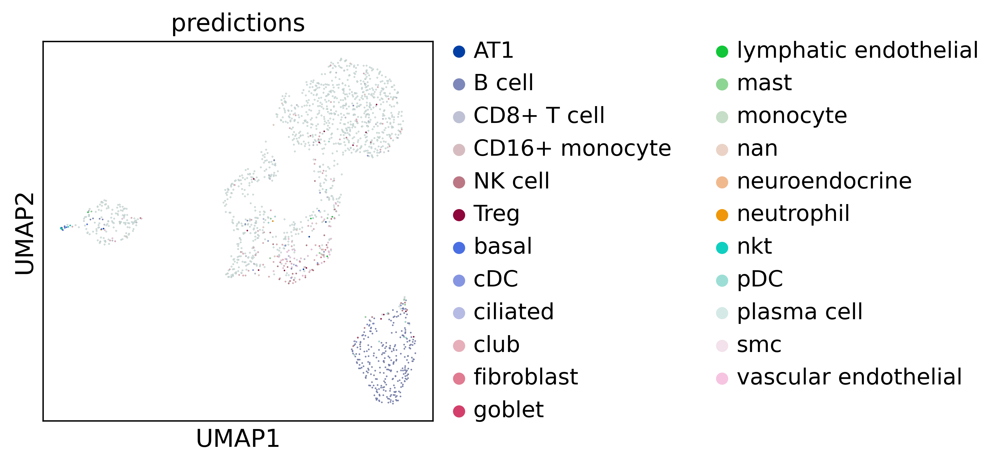

In [ ]:
sc.pl.umap(B_Plasma, color=['predictions'], edgecolor='k', linewidth=.035, size=3, )

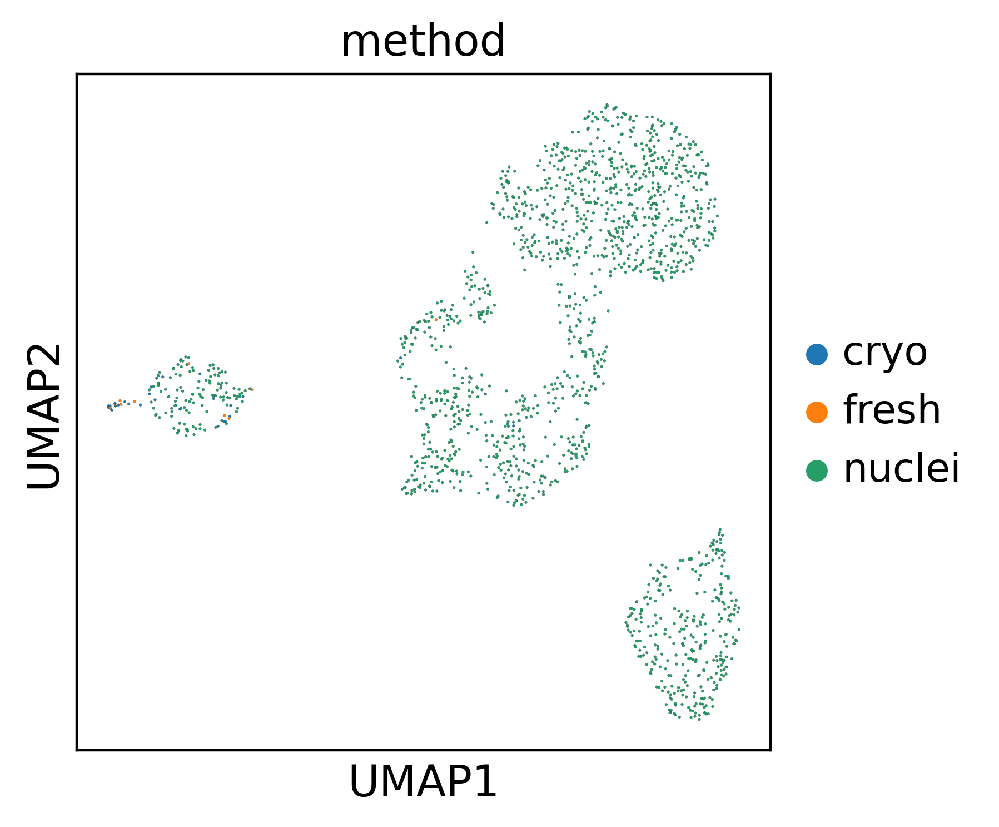

In [ ]:
sc.pl.umap(B_Plasma, color='method', edgecolor='k', linewidth=.035, size=3, )

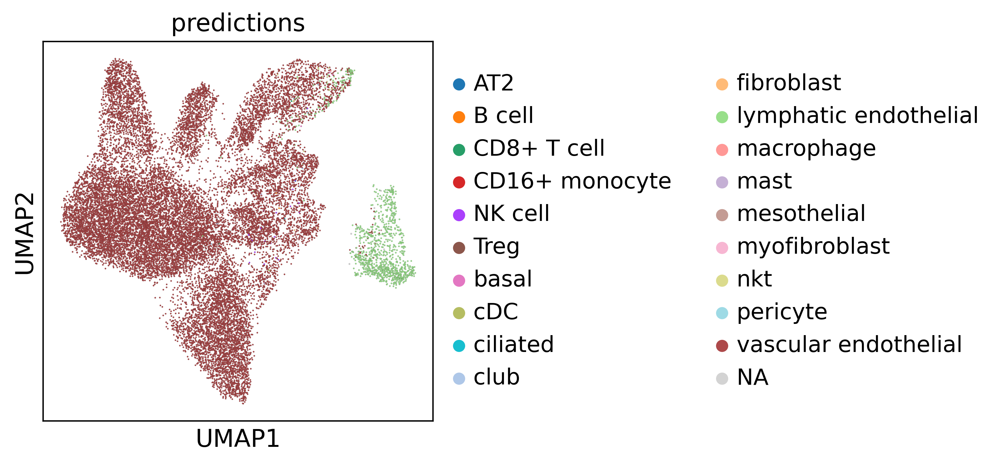

In [ ]:
sc.pl.umap(Endothelial, color='predictions', edgecolor='k', linewidth=.035, size=3, )

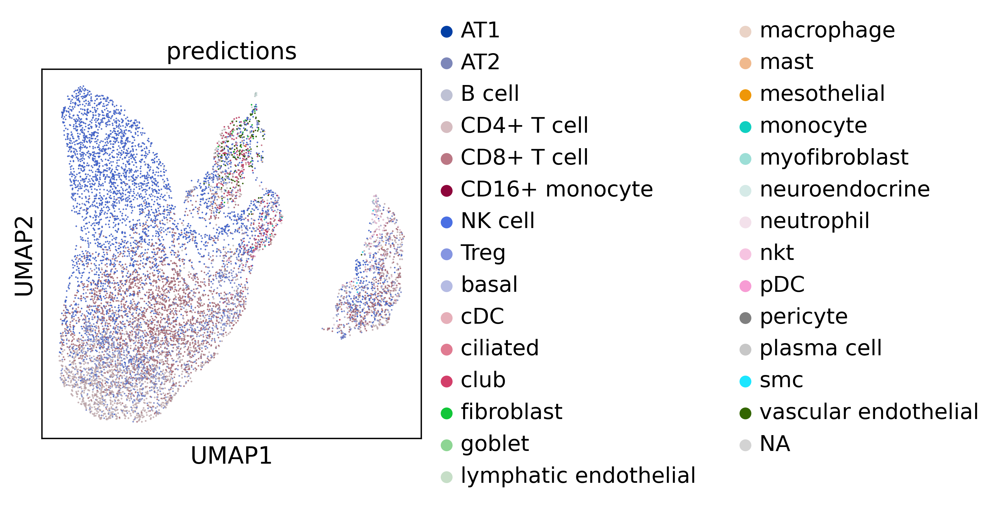

In [ ]:
sc.pl.umap(T_NK, color='predictions', edgecolor='k', linewidth=.035, size=3, )

In [ ]:
mut_file = DATA / "lung.scp.metadata.txt"

# load mutation
metadata = pd.read_csv(DATA / mut_file, sep="\t", comment='#')

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (1,2,3,5,10,11,12) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
t_file = DATA / "upload.scp.X_umap.coords.txt"

# load mutation
coords = pd.read_csv(DATA / t_file, sep="\t", comment='#')

In [ ]:
lung

AnnData object with n_obs × n_vars = 106792 × 30983
    obs: 'n_genes', 'n_UMI', 'percent_mito', 'method', 'doublet', 'predicted_celltype', 'compartment', 'Cluster', 'SubCluster', 'Viral+', 'leiden_res_2', 'leiden_res_1.3', 'donor', 'disease'
    var: 'featureid'
    uns: 'Cluster_colors', 'Nuc-Cell_colors', 'SubCluster_colors', 'W_harmony', 'genome', 'harmony_knn_distances', 'harmony_knn_indices', 'manual_coarse_annotation_colors', 'method_colors', 'modality', 'neighbors', 'pca', 'predictions_colors', 'sample_colors', 'umap', 'donor_colors'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'sig_background'
    varm: 'PCs', 'de_res'
    layers: 'counts', 'winsorized'

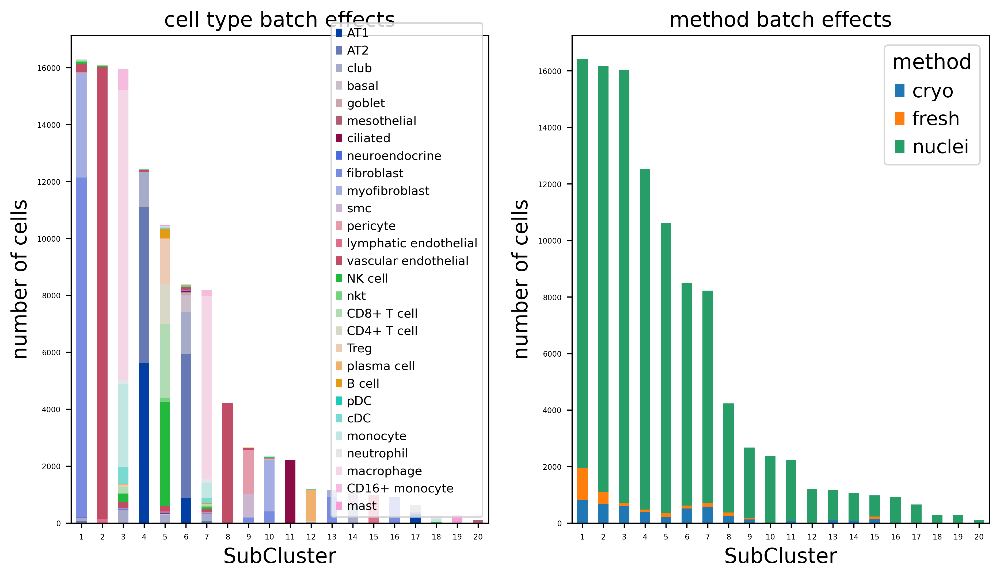

In [ ]:
method_cluster_wide = lung.obs[['method', 'leiden_res_1.3']].groupby(['method', 'leiden_res_1.3']).size().unstack().T
sample_cluster_wide = lung.obs[['predicted_celltype', 'leiden_res_1.3']].groupby(['predicted_celltype', 'leiden_res_1.3']).size().unstack().T

fig, axes = plt.pyplot.subplots(nrows=1, ncols=2, figsize=(11,6))


sample_cluster_wide.plot(kind='bar', 
                        stacked=True,
                        title="cell type batch effects",
                        xlabel='SubCluster',
                        ylabel='number of cells',
                        grid=False,
                        sort_columns=True,
                        ax=axes[0], 
                        cmap=LinearSegmentedColormap.from_list('my_colormap', lung.uns['sample_colors']))
axes[0].legend(fontsize='xx-small')

method_cluster_wide.plot(kind='bar', 
                        stacked=True,
                        title="method batch effects",
                        xlabel='SubCluster',
                        ylabel='number of cells',
                        grid=False,
                        sort_columns=True, 
                        ax=axes[1])

axes[0].tick_params(labelrotation=0, labelsize=5)
axes[1].tick_params(labelrotation=0, labelsize=5)

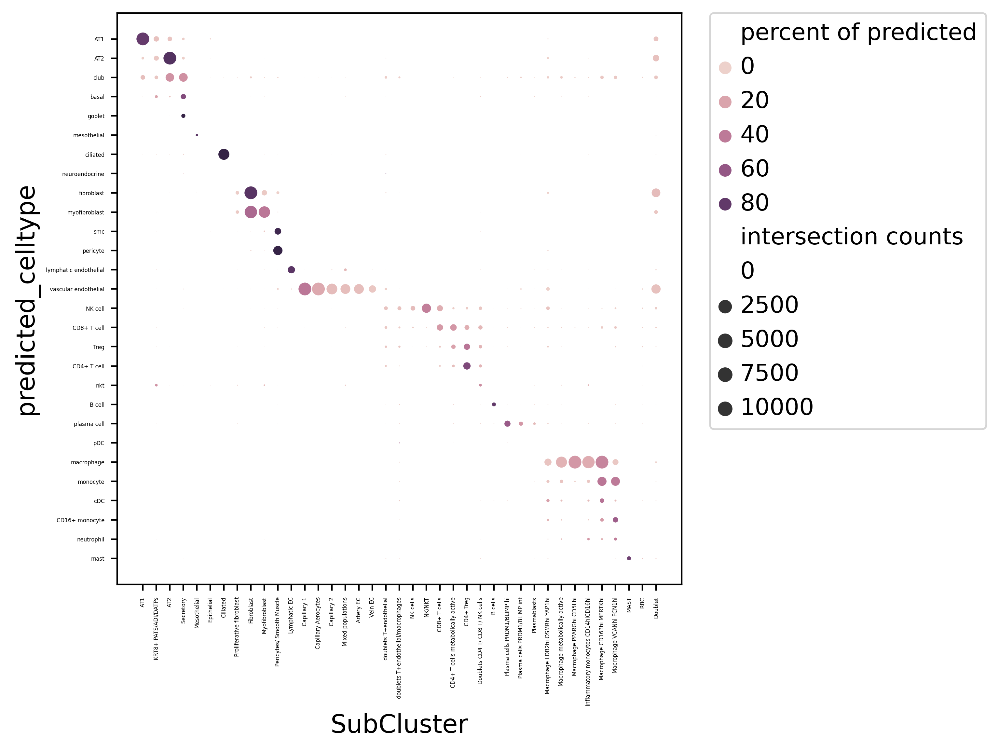

In [ ]:
cmap = sns.cubehelix_palette(start=45.5, light=1, rot=.1, n_colors=20)

counts = pd.crosstab(lung.obs['predicted_celltype'], lung.obs['SubCluster']).T
comparison = 100*(counts/counts.sum(axis=0)).T

counts_long = counts.T.loc[prediction_order,subcluster_order].unstack().reset_index()
comparison_long = comparison.loc[prediction_order,subcluster_order].unstack().reset_index()

long = counts_long.merge(comparison_long, on=['SubCluster', 'predicted_celltype'])
long.columns = ['SubCluster', 'predicted_celltype','intersection counts',  'percent of predicted']

predict2int = {label:i for i,label in enumerate(prediction_order)}
SubCluster2int = {label:i for i,label in enumerate(subcluster_order)}

long.predicted_celltype = long.predicted_celltype.map(predict2int)
long.SubCluster = long.SubCluster.map(SubCluster2int)

plt.pyplot.figure(figsize=(8,6))
cmap = sns.cubehelix_palette(start=45.5, light=1, rot=.1, n_colors=20)
ax = sns.scatterplot(data=long, 
                     x='SubCluster', 
                     y='predicted_celltype', 
                     hue='percent of predicted', 
                     size='intersection counts', 
                     cmap=cmap, 
                     sizes=(0,50), 
                     hue_norm=(0,100), 
                     size_norm=(0,3000))#, linewidth=.25, edgecolor=[.5, .5, .5])
plt.pyplot.grid(False)
ax.set_xticks(range(len(subcluster_order)))
ax.set_xticklabels(subcluster_order)
plt.pyplot.xticks(rotation=90, ha='center', fontsize=3);
ax.set_yticks(range(len(prediction_order)))
ax.set_yticklabels(prediction_order)
plt.pyplot.yticks(fontsize=3)
plt.pyplot.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
plt.pyplot.tight_layout()

In [ ]:
def get_type_counts(obs, field='compartment', method='nuclei'):
    obs = obs[~obs.predicted_celltype.isnull()]
    counts = obs.groupby(['method', 'donor', field], observed=True).size().reset_index()
    totals = obs.groupby(['method', 'donor'], observed=True).size().reset_index()
    counts = counts.rename(columns={0:'cell_counts'})
    totals = totals.rename(columns={0:'sample_total'})
    counts = counts.merge(totals, on=['method', 'donor'])
    counts['percentage'] = 100*counts['cell_counts']/counts['sample_total']
    
    if method:
        counts = counts[(counts.method==method) & (counts[field]!='nan')]
        counts[field] = counts[field].cat.remove_unused_categories()
        type_order = counts.groupby(field).median().sort_values('percentage').index
        
    order = counts.groupby(field)['percentage'].max().sort_values().index
    return counts.sort_values('percentage'),order

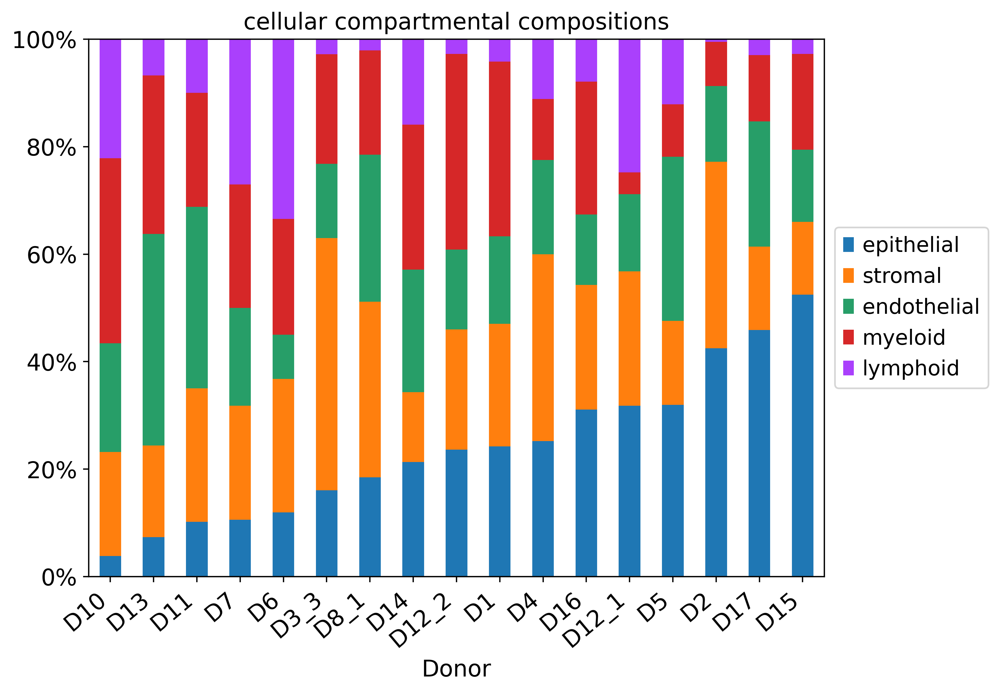

In [ ]:
field = 'compartment'
nuclei_counts,order = get_type_counts(lung.obs, field=field, method='nuclei')
nuclei_counts['compartment'] = nuclei_counts['compartment'].cat.reorder_categories(['epithelial', 'stromal', 'endothelial',  'myeloid','lymphoid'])
nuclei_counts_wide = nuclei_counts[['donor', 'compartment', 'percentage']].pivot(index='donor', columns='compartment')
nuclei_counts_wide.columns = nuclei_counts_wide.columns.droplevel(0)
nuclei_counts_wide = nuclei_counts_wide.sort_values('epithelial')
ax = nuclei_counts_wide.plot(kind='bar', 
                        stacked=True,
                        title="cellular compartmental compositions",
                        xlabel='Donor',
                        ylabel=None,
                        ylim=[0,100],
                        figsize=[8,6], 
                        grid=False,
                        sort_columns=True, # use if donor names are ordered
                       )
plt.pyplot.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.pyplot.xticks(rotation=40, ha='right');
fmt = '%.0f%%' # Format you want the ticks, e.g. '40%'
yticks = mtick.FormatStrFormatter(fmt)
ax.yaxis.set_major_formatter(yticks)

<ipython-input-54-9e40c574a8b3>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  myeloid_subcluster['SubCluster'] = myeloid_subcluster['SubCluster'].cat.remove_unused_categories()


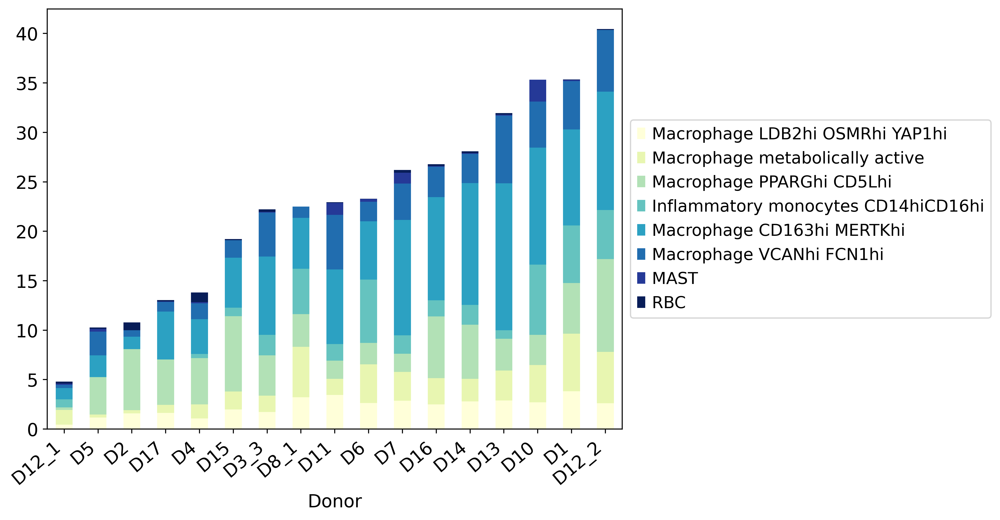

In [ ]:
myeloid_subclusters = subclusterComparment2types['Myeloid']
nuclei_subcluster,order = get_type_counts(lung.obs, field='SubCluster', method='nuclei')
myeloid_subcluster = nuclei_subcluster[nuclei_subcluster.SubCluster.isin(myeloid_subclusters)]
myeloid_subcluster['SubCluster'] = myeloid_subcluster['SubCluster'].cat.remove_unused_categories()
myeloid_subcluster_wide = myeloid_subcluster[['donor', 'SubCluster', 'percentage']].pivot(index='donor', columns='SubCluster')
myeloid_subcluster_wide.columns = myeloid_subcluster_wide.columns.droplevel(0)
myeloid_subcluster_wide = myeloid_subcluster_wide.loc[myeloid_subcluster_wide.fillna(0).sum(axis=1).sort_values().index]
ax = myeloid_subcluster_wide.plot(kind='bar', 
                        stacked=True,
                        cmap='YlGnBu',
                        xlabel='Donor',
                        figsize=[8,6], 
                        grid=False,
                        sort_columns=True,
                       )
plt.pyplot.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.pyplot.xticks(rotation=40, ha='right');
fmt = '%.0f%%'
yticks = mtick.FormatStrFormatter(fmt)

# Fig 2A and ED2I

In [ ]:
def invert_list_dict(list_dict):
    inverted = {}
    [inverted.update(dict(zip(list_dict[value], 
                                  len(list_dict[value])*[value]))) for value in list_dict.keys()]
    return inverted

In [ ]:
lung = sc.read(DATA / 'lung.h5ad')

In [ ]:
subclusterComparment2types = {'Epithelial':
                                ['AT1',  'KRT8+ PATS/ADI/DATPs', 'AT2', 'Secretory', 'Mesothelial', 'Epithelial', 
                                 'Ciliated', ], 
                              'Stromal':
                                ['Proliferative fibroblast', 'Fibroblast', 'Myofibroblast', 'Pericytes/ Smooth Muscle'], 
                             'Endothelial':
                                 ['Lymphatic EC', 'Capillary 1', 'Capillary Aerocytes', 'Capillary 2', 'Mixed populations', 
                                  'Artery EC', 'Vein EC', 'doublets T+endothelial', 
                                  'doublets T+endothelial/macrophages',  ], 
                             'Lymphoid':
                                 ['NK cells', 'NK/NKT', 
                                  'CD8+ T cells', 'CD4+ T cells metabolically active', 'CD4+ Treg', 'Doublets CD4 T/ CD8 T/ NK cells',
                                  'B cells', 'Plasma cells PRDM1/BLIMP hi', 'Plasma cells PRDM1/BLIMP int',  'Plasmablasts',
                                  ], 
                            'Myeloid':
                                 ['Macrophage LDB2hi OSMRhi YAP1hi', 'Macrophage metabolically active', 
                                  'Macrophage PPARGhi CD5Lhi', 'Inflammatory monocytes CD14hiCD16hi', 
                                  'Macrophage CD163hi MERTKhi','Macrophage VCANhi FCN1hi', 
                                  'MAST', 'RBC'], 
                             'Other':
                                 ['Doublet']}

predictionCompartment2types = {'Epithelial':
                                ['AT1',  'AT2',   'club', 'basal', 'goblet', 'mesothelial', 'ciliated', 'neuroendocrine'], 
                              'Stromal':
                                ['fibroblast', 'myofibroblast', 'smc', 'pericyte'], 
                             'Endothelial':
                                 ['lymphatic endothelial', 'vascular endothelial'], 
                             'Lymphoid':
                                 ['NK cell', 'CD8+ T cell', 'Treg',
                                  'CD4+ T cell', 'nkt', 'B cell', 'plasma cell', 
                                   'pDC'],
                            'Myeloid':
                                 [  'macrophage', 'monocyte','cDC',
                                  'CD16+ monocyte','neutrophil', 'mast']
                              }

compartments = subclusterComparment2types.keys()
prediction_order = np.sum([predictionCompartment2types[compartment] for compartment in compartments if compartment in predictionCompartment2types.keys()])
subcluster_order = np.sum([subclusterComparment2types[compartment] for compartment in compartments])

SubCluster2Compartment = invert_list_dict(subclusterComparment2types)
prediction2Compartment = invert_list_dict(predictionCompartment2types)

/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:86: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


In [ ]:
donor_compartments = lung.obs[lung.obs.method=='nuclei'].groupby(['donor', 'compartment']).size().unstack()


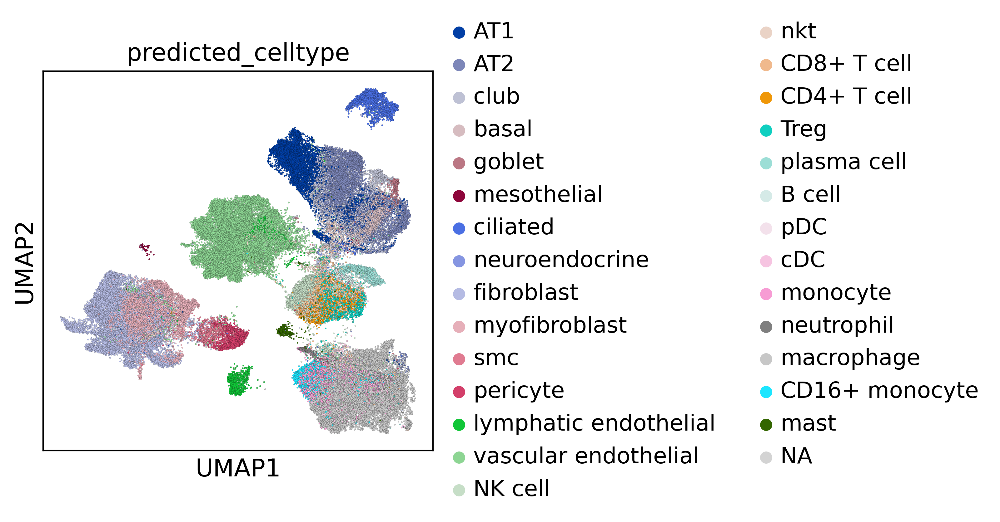

In [ ]:
# figure 2A
    # obs: 'n_genes', 'n_UMI', 'percent_mito', 'method', 'doublet', 'predicted_celltype', 'compartment', 'Cluster', 'SubCluster', 'Viral+', 'leiden_res_2', 'leiden_res_1.3', 'donor', 'disease'
sc.pl.umap(lung, color='predicted_celltype', edgecolor='k', linewidth=.035, size=3, )


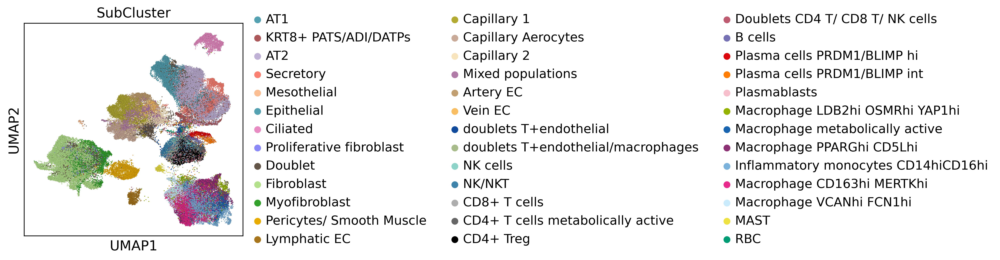

In [ ]:
sc.pl.umap(lung, color='SubCluster', edgecolor='k', linewidth=.035, size=3, )


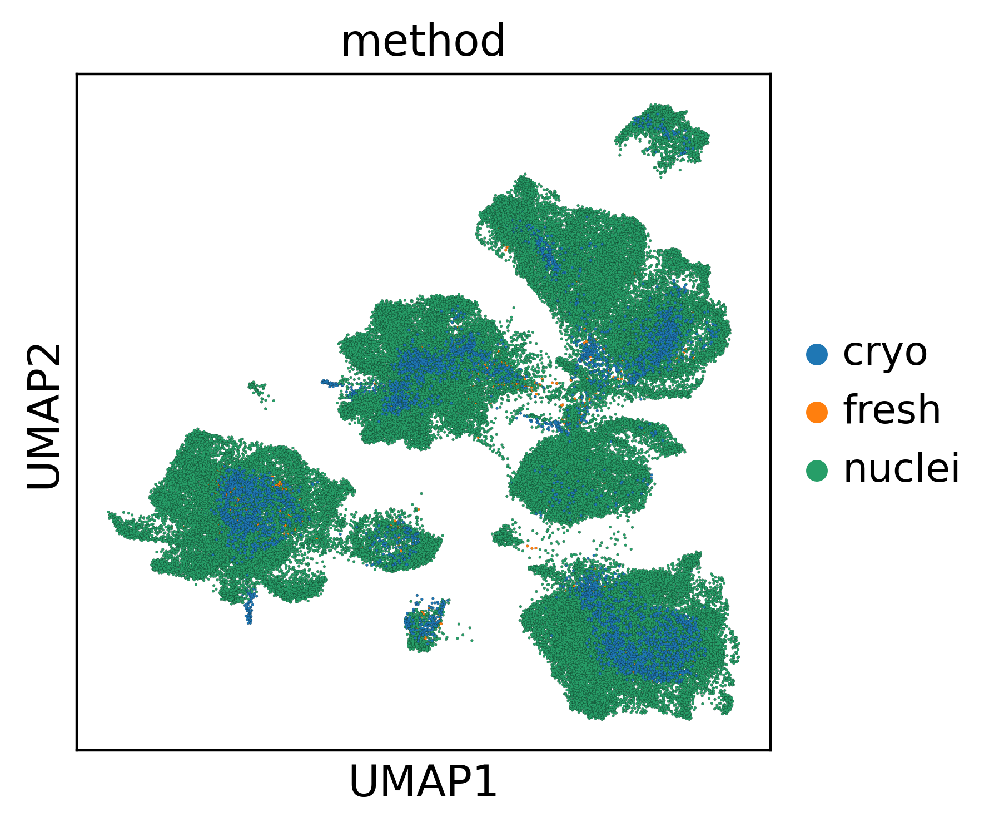

In [ ]:
sc.pl.umap(lung, color='method', edgecolor='k', linewidth=.035, size=3, )

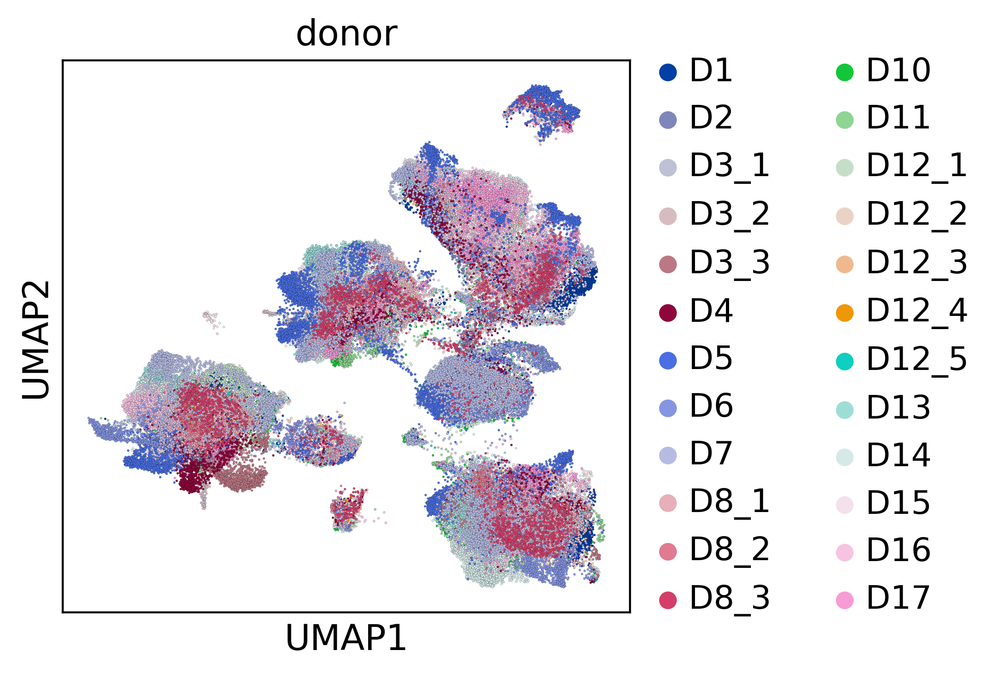

In [ ]:
sc.pl.umap(lung, color='donor', edgecolor='k', linewidth=.035, size=3, )

In [ ]:
lung

AnnData object with n_obs × n_vars = 106792 × 30983
    obs: 'n_genes', 'n_UMI', 'percent_mito', 'method', 'doublet', 'predicted_celltype', 'compartment', 'Cluster', 'SubCluster', 'Viral', 'leiden_res_2', 'leiden_res_1.3', 'donor', 'disease'
    var: 'featureid'
    uns: 'Cluster_colors', 'Nuc-Cell_colors', 'SubCluster_colors', 'W_harmony', 'genome', 'harmony_knn_distances', 'harmony_knn_indices', 'manual_coarse_annotation_colors', 'method_colors', 'modality', 'neighbors', 'pca', 'predictions_colors', 'sample_colors', 'umap', 'donor_colors'
    obsm: 'X_harmony', 'X_pca', 'X_umap', 'sig_background'
    varm: 'PCs', 'de_res'
    layers: 'counts', 'winsorized'

In [ ]:
lung.obs.columns = ['n_genes', 'n_UMI', 'percent_mito', 'method', 'doublet', 'predicted_celltype', 'compartment', 'Cluster', 'SubCluster', 'Viral', 'leiden_res_2', 'leiden_res_1.3', 'donor', 'disease']

In [ ]:
type(lung.obs.viral)

pandas.core.series.Series

In [ ]:
lung.obs.viral.replace({True: 1, False: -1}, inplace=True)

AttributeError: ignored

In [ ]:
lung.obs.viral

barcodekey
02-P005175-S053-R01-GTTTGGAGTATCAAGA   -1
02-P005175-S053-R01-TGCAGTAAGCAGATAT   -1
02-P005175-S053-R01-CCCTAACCACTACCGG   -1
02-P005175-S053-R01-TCCGAAAAGGTATCTC   -1
02-P005175-S053-R01-TGCACGGTCTCGGCTT   -1
                                       ..
04-P006354-S057-R02-AGGTCCGGTGATGATA   -1
04-P006354-S057-R02-CTCTACGCAGATCTGT   -1
04-P006354-S057-R02-TGACAACTCTCGATGA   -1
04-P006354-S057-R02-CATGCCTTCGGATGGA   -1
04-P006354-S057-R02-CGTCACTCATTCTTAC   -1
Name: Viral+, Length: 106792, dtype: int64

# Other organs

In [ ]:
heart = sc.read(DATA / 'covid_heart_LV.h5ad')
kidney = sc.read(DATA / 'kidney.h5ad')
liver = sc.read(DATA / 'liver.h5ad')

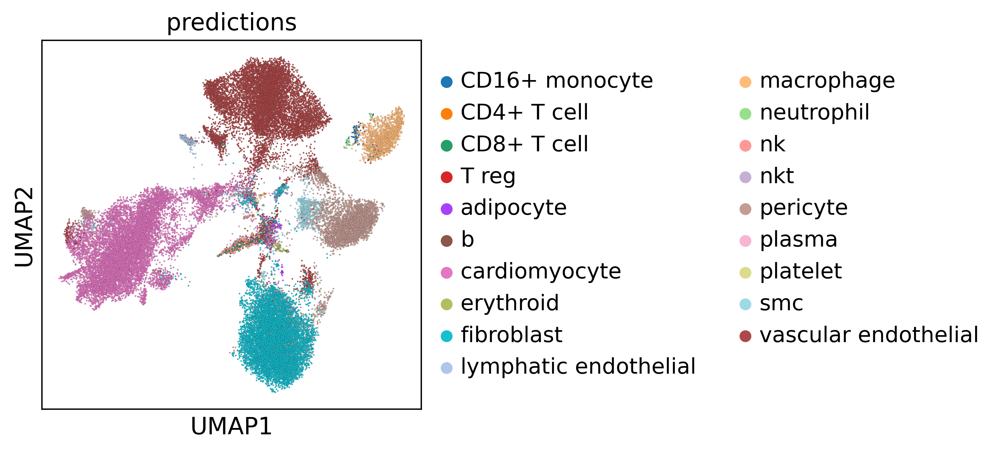

In [ ]:
sc.pl.umap(heart, color=['predictions'], edgecolor='k', linewidth=.035, size=3, )

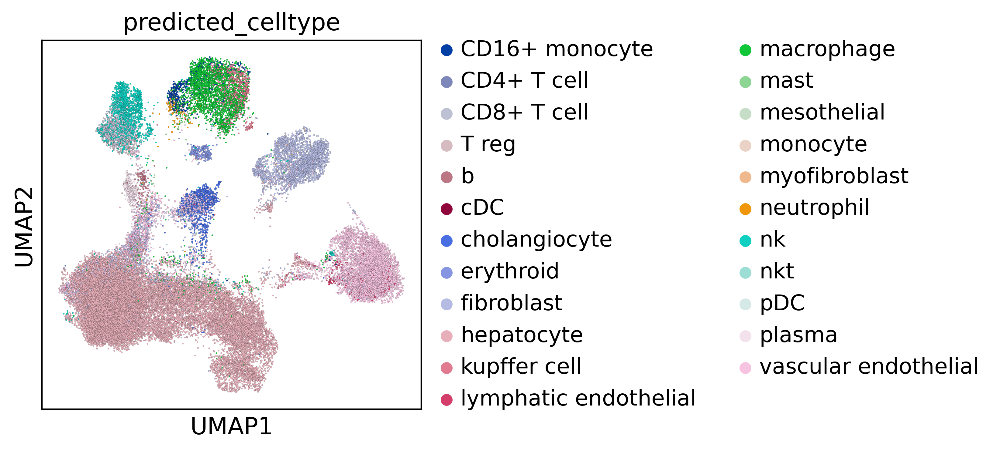

In [ ]:
sc.pl.umap(liver, color=['predicted_celltype'], edgecolor='k', linewidth=.035, size=3, )

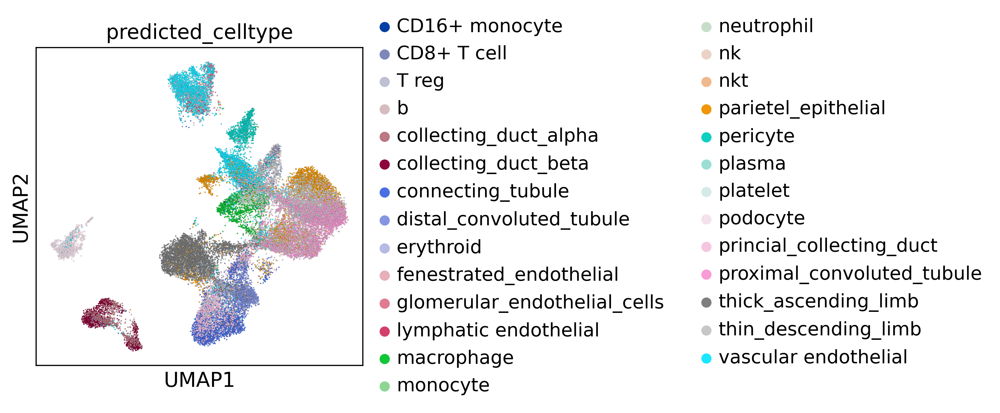

In [ ]:
sc.pl.umap(kidney, color=['predicted_celltype'], edgecolor='k', linewidth=.035, size=3, )